<a href="https://www.kaggle.com/code/muhammadasifwazir/failure-classification-using-machine-learning?scriptVersionId=198815401" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Importing Packages

In [1]:
# Basic Packages
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt

from random import sample
from numpy.random import uniform

import seaborn as sns

import statsmodels.api as sm

import time

from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale, normalize
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, roc_auc_score, confusion_matrix, matthews_corrcoef, ConfusionMatrixDisplay

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier

# Getting the Data

In [2]:
# Import necessary libraries
import requests
import zipfile
import os

# Define the URL of the dataset
url = "https://archive.ics.uci.edu/static/public/601/ai4i+2020+predictive+maintenance+dataset.zip"

# Download the dataset
response = requests.get(url)

# Save the file locally
zip_file = "ai4i_2020_predictive_maintenance.zip"
with open(zip_file, "wb") as file:
    file.write(response.content)

print("Download complete.")

# Extract the ZIP file
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall("ai4i_2020_dataset")

print("Extraction complete.")

# List the extracted files to verify
extracted_files = os.listdir("ai4i_2020_dataset")
print("Extracted files:", extracted_files)


Download complete.
Extraction complete.
Extracted files: ['ai4i2020.csv']


In [3]:
completeDataset = pd.read_csv("/kaggle/working/ai4i_2020_dataset/ai4i2020.csv")
print("Original Data")
completeDataset.head()

Original Data


,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


# Pruning Features

In [4]:
modifiedDataset = completeDataset.drop(["UDI", "Product ID"], axis=1)

modifiedDataset.head()

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,TWF,HDF,PWF,OSF,RNF
0,M,298.1,308.6,1551,42.8,0,0,0,0,0,0,0
1,L,298.2,308.7,1408,46.3,3,0,0,0,0,0,0
2,L,298.1,308.5,1498,49.4,5,0,0,0,0,0,0
3,L,298.2,308.6,1433,39.5,7,0,0,0,0,0,0
4,L,298.2,308.7,1408,40.0,9,0,0,0,0,0,0


# Histogram Plots

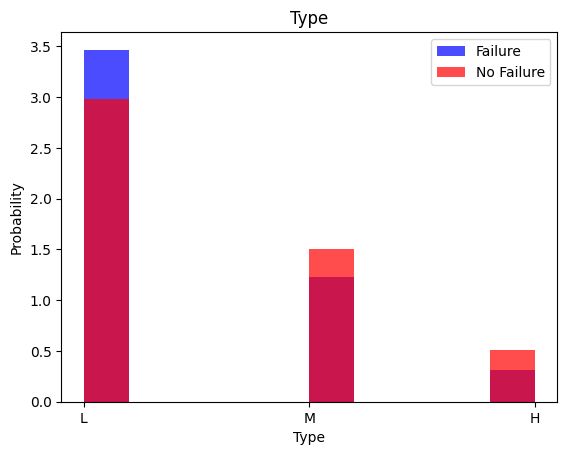

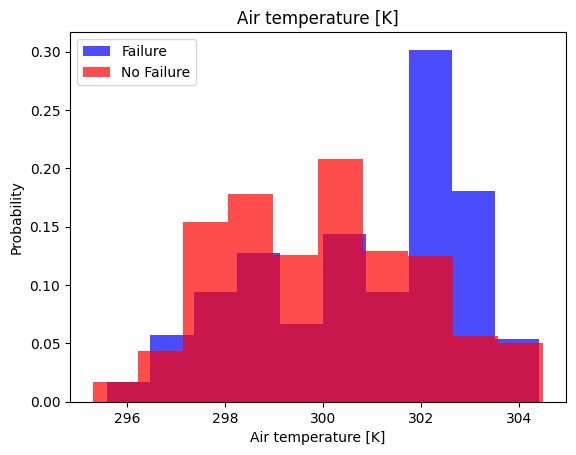

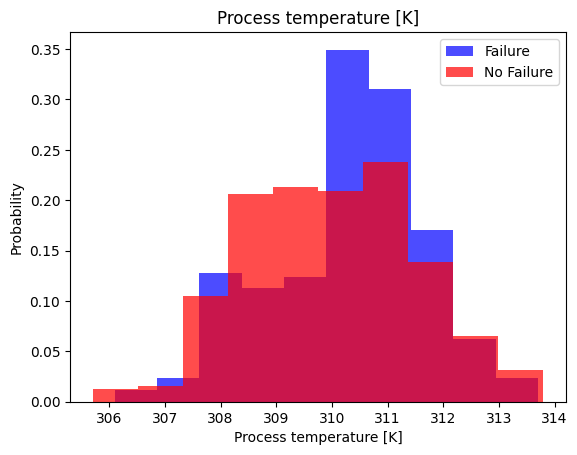

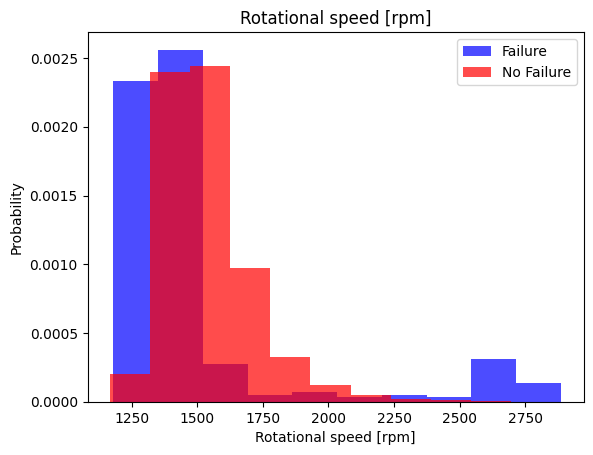

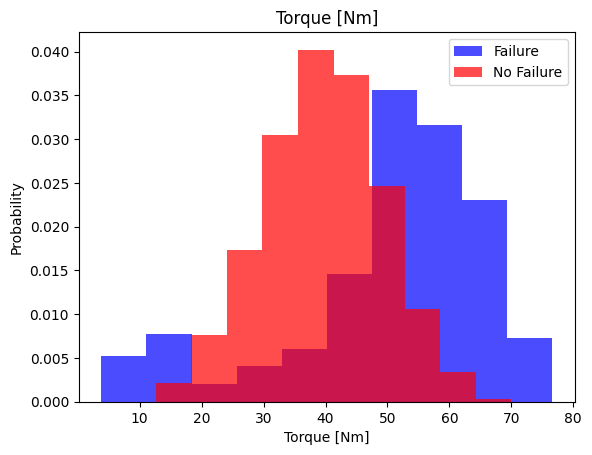

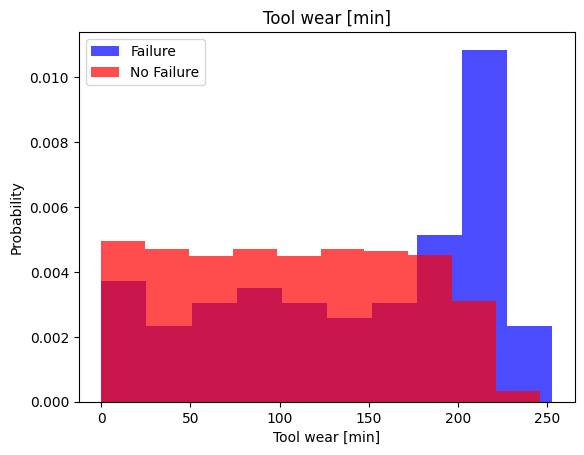

In [5]:
feature_labels = list(modifiedDataset.columns)

for feature_label in feature_labels[:6]:
    plt.hist(modifiedDataset[modifiedDataset['Machine failure'] == 1][feature_label], color='blue', density=True, alpha= 0.7, label='Failure')
    plt.hist(modifiedDataset[modifiedDataset['Machine failure'] == 0][feature_label], color='red', density=True, alpha= 0.7, label='No Failure')
    plt.xlabel(feature_label)
    plt.ylabel("Probability")
    plt.title(feature_label)
    plt.legend()
    plt.show()

# Correlation Matrix

<Axes: >

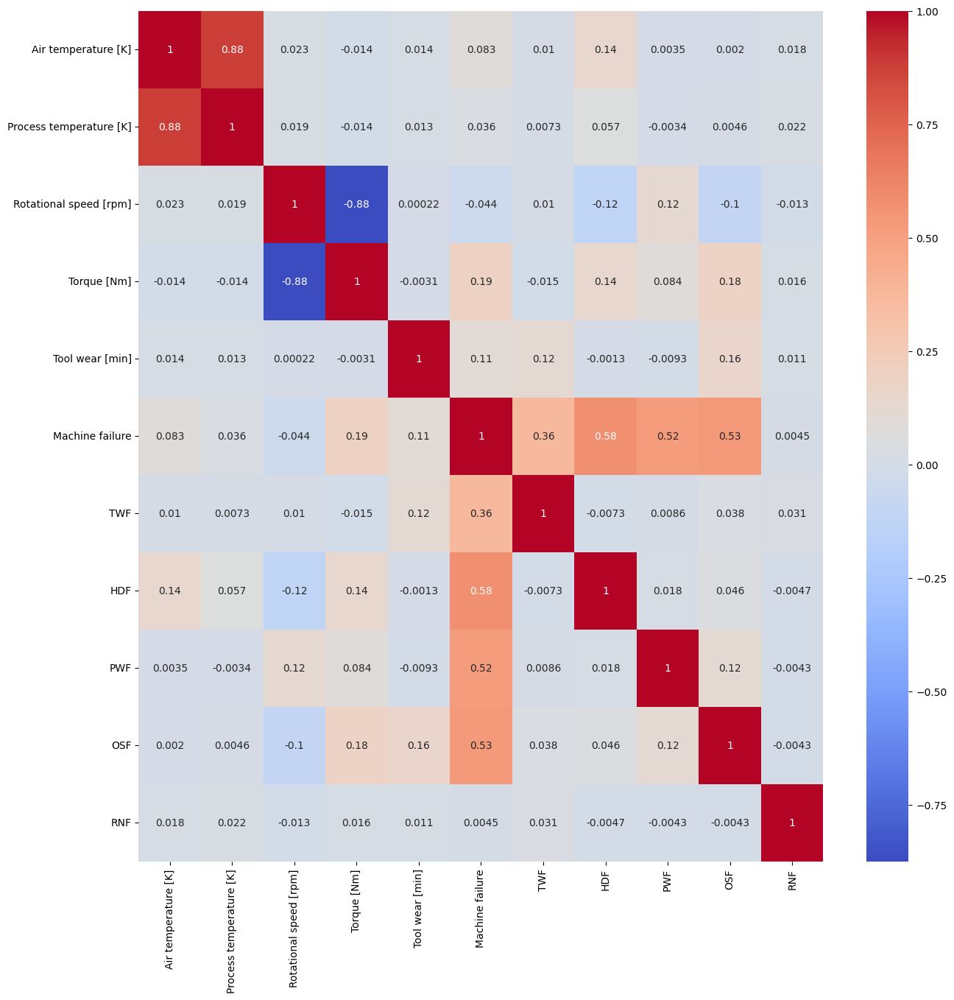

In [6]:
plt.figure(figsize=(15, 15))
correlationMatrix = modifiedDataset.drop("Type", axis=1).corr()
sns.heatmap(correlationMatrix, annot=True, cmap="coolwarm")

# Creating Single Output Variable

In [7]:
modifiedDataset['Machine failure'] = 0
modifiedDataset['Machine failure'][modifiedDataset['TWF'] == 1] = 1
modifiedDataset['Machine failure'][modifiedDataset['HDF'] == 1] = 2
modifiedDataset['Machine failure'][modifiedDataset['PWF'] == 1] = 3
modifiedDataset['Machine failure'][modifiedDataset['OSF'] == 1] = 4
modifiedDataset['Machine failure'][modifiedDataset['RNF'] == 1] = 5
modifiedDataset = modifiedDataset.drop(['TWF', 'HDF', 'PWF', 'OSF', 'RNF'], axis=1)

modifiedDataset.head()

/tmp/ipykernel_17/1728915431.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  modifiedDataset['Machine failure'][modifiedDataset['TWF'] == 1] = 1
/tmp/ipykernel_17/1728915431.py:2: SettingWithCopyWarning: 
A value is trying to be set on a

,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure
0,M,298.1,308.6,1551,42.8,0,0
1,L,298.2,308.7,1408,46.3,3,0
2,L,298.1,308.5,1498,49.4,5,0
3,L,298.2,308.6,1433,39.5,7,0
4,L,298.2,308.7,1408,40.0,9,0


# Calculating new Features

In [8]:
modifiedDataset['PWF Criteria'] = modifiedDataset['Rotational speed [rpm]'] * modifiedDataset['Torque [Nm]'] * ((2 * math.pi) / 60)
modifiedDataset['TWF Criteria'] = modifiedDataset['Torque [Nm]'] * modifiedDataset['Tool wear [min]']
modifiedDataset['HDF Criteria'] = modifiedDataset['Process temperature [K]'] - modifiedDataset['Air temperature [K]']
#modifiedDataset['Temperature power'] = modifiedDataset['Temperature difference'] / modifiedDataset['Power']
modifiedDataset = modifiedDataset[['Air temperature [K]',
         'Process temperature [K]',
         'Rotational speed [rpm]',
         'Torque [Nm]',
         'Tool wear [min]',
         'PWF Criteria',
         'TWF Criteria',
         'HDF Criteria',
         #'Temperature power',
         'Type',
         'Machine failure'
         ]]

modifiedDataset.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],PWF Criteria,TWF Criteria,HDF Criteria,Type,Machine failure
0,298.1,308.6,1551,42.8,0,6951.590560,0.0,10.5,M,0
1,298.2,308.7,1408,46.3,3,6826.722724,138.9,10.5,L,0
2,298.1,308.5,1498,49.4,5,7749.387543,247.0,10.4,L,0
3,298.2,308.6,1433,39.5,7,5927.504659,276.5,10.4,L,0
4,298.2,308.7,1408,40.0,9,5897.816608,360.0,10.5,L,0


# One hot Encoding Output

In [9]:
modifiedDataset = pd.get_dummies(modifiedDataset, drop_first=False).astype(float)
modifiedDataset.head()

,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],PWF Criteria,TWF Criteria,HDF Criteria,Machine failure,Type_H,Type_L,Type_M
0,298.1,308.6,1551.0,42.8,0.0,6951.590560,0.0,10.5,0.0,0.0,0.0,1.0
1,298.2,308.7,1408.0,46.3,3.0,6826.722724,138.9,10.5,0.0,0.0,1.0,0.0
2,298.1,308.5,1498.0,49.4,5.0,7749.387543,247.0,10.4,0.0,0.0,1.0,0.0
3,298.2,308.6,1433.0,39.5,7.0,5927.504659,276.5,10.4,0.0,0.0,1.0,0.0
4,298.2,308.7,1408.0,40.0,9.0,5897.816608,360.0,10.5,0.0,0.0,1.0,0.0


# Checking for NaN Features

In [10]:
features = list(modifiedDataset.columns)

for feature in features:
    print(feature + "-" + str(
        len(modifiedDataset[modifiedDataset[feature].isna()])))

Air temperature [K]-0
Process temperature [K]-0
Rotational speed [rpm]-0
Torque [Nm]-0
Tool wear [min]-0
PWF Criteria-0
TWF Criteria-0
HDF Criteria-0
Machine failure-0
Type_H-0
Type_L-0
Type_M-0


# SNS Plots

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

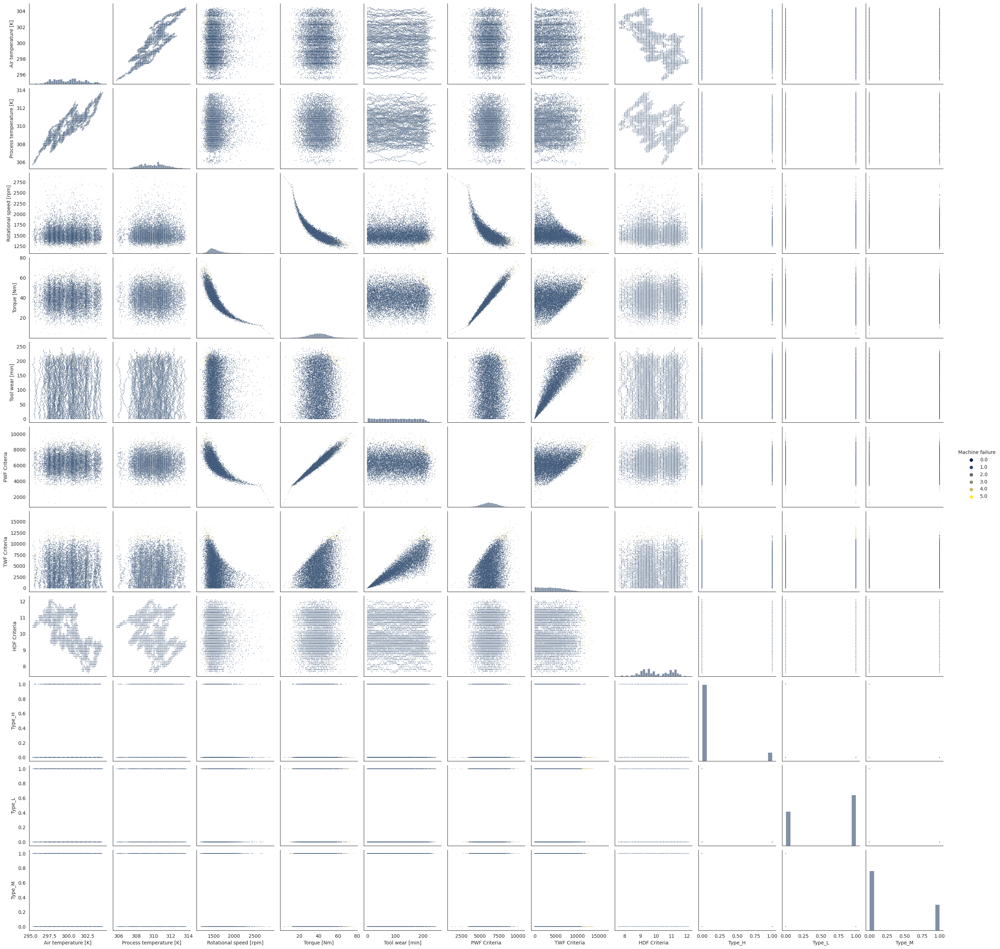

In [11]:
sns.set_style('white')
plot_kws = {"s": 1}
g = sns.pairplot(modifiedDataset,
                 diag_kind='hist',
                 corner=False,
                 palette='cividis',
                 hue='Machine failure',
                 plot_kws=plot_kws)  
plt.show()

# Principal Component Analysis

In [12]:
pca=PCA()
X_pca=pca.fit_transform(modifiedDataset)  
component_names=[f"PC{i+1}" for i in range(X_pca.shape[1])]
X_pca=pd.DataFrame(X_pca,columns=component_names)
X_pca['Machine failure']=modifiedDataset["Machine failure"]
X_pca.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,Machine failure
0,-4156.452606,-1339.746304,92.009397,-5.543130,2.398462,-1.620017,-0.206554,0.883839,0.225616,-0.216823,5.752299e-14,-2.569400e-15,0.0
1,-4035.500743,-1214.354620,-66.077464,-7.828821,2.174433,0.872074,-0.094731,-0.532463,0.000303,-0.079600,-6.050253e-15,3.837756e-16,0.0
2,-3786.265239,-2088.128022,146.820156,-21.300394,2.437963,-1.211779,-0.336919,-0.519255,0.029536,-0.078631,9.172422e-16,-2.066606e-16,0.0
3,-4041.083404,-309.461623,-161.324896,8.888479,2.177354,0.589386,-0.239626,-0.533453,0.072459,-0.083861,1.061783e-15,-2.405254e-16,0.0
4,-3962.683179,-270.463336,-189.875889,8.549658,2.133623,0.964546,-0.091396,-0.536500,0.065504,-0.083721,1.083710e-15,4.685274e-16,0.0
5,-3807.845857,-599.317270,-125.335361,2.938603,2.295861,0.643606,-0.144637,0.869602,0.178067,-0.216965,9.423385e-16,-1.132692e-17,0.0
6,-3575.664638,-1211.586113,95.763170,-4.719739,2.409040,-1.723339,-0.208147,-0.513394,0.077409,-0.083382,9.406773e-16,3.350744e-16,0.0
7,-3602.634595,-728.917524,-0.322100,2.448955,2.367601,-0.945211,-0.186034,-0.518666,0.075491,-0.084385,9.378387e-16,-3.348417e-16,0.0
8,-3957.587174,673.823679,-53.924330,28.794784,2.135146,-0.767288,-0.216714,0.898931,0.169154,-0.222674,1.056791e-15,1.571042e-16,0.0
9,-3869.406853,585.360353,34.612520,27.975710,1.885970,-1.171617,0.004896,0.911303,0.120210,-0.222010,1.144071e-15,6.187377e-15,0.0


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

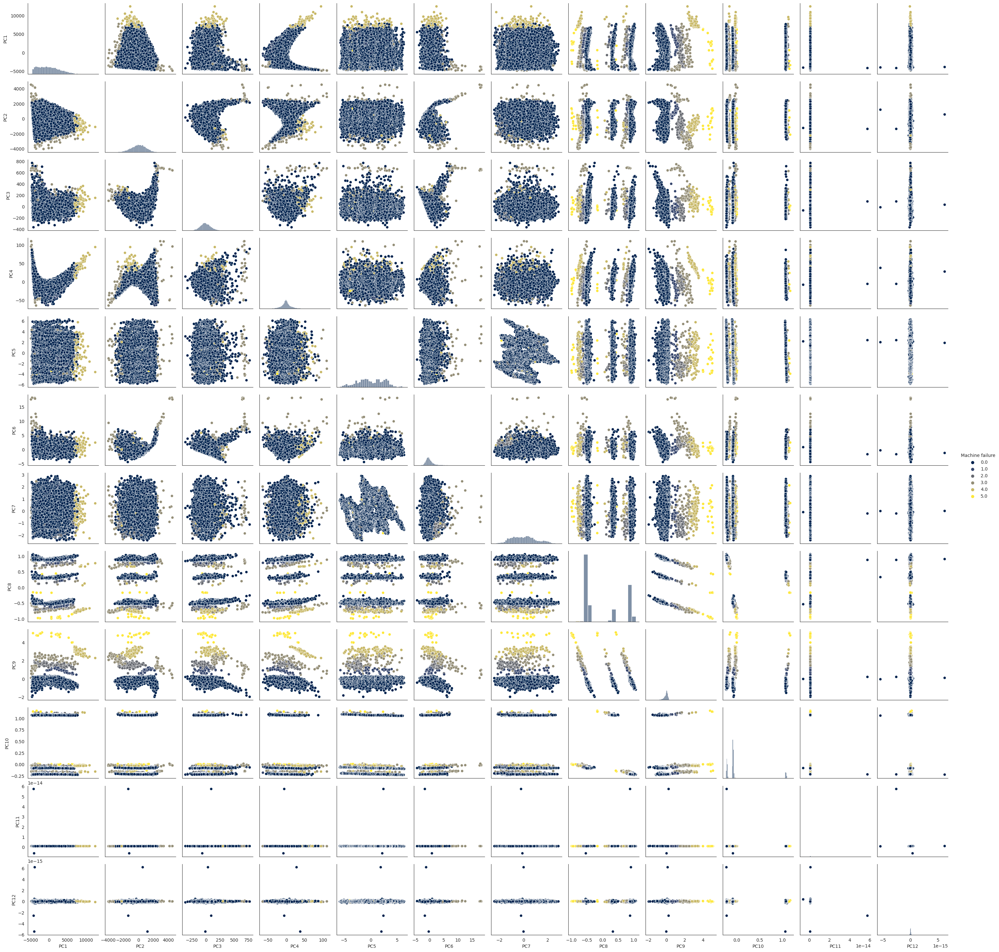

In [13]:
sns.set_style('white')
plot_kws={"s":1}
g=sns.pairplot(X_pca,
                diag_kind='hist',
                corner=False,
                palette='cividis',
                hue='Machine failure')
plt.show()  

# Hopkins Statistic

In [14]:
X = modifiedDataset.drop("Machine failure", axis=1)
y = modifiedDataset["Machine failure"]

In [15]:
def hopkins_statistic(X, k):
    try:
        X = X.values
    except:
        pass

    X = normalize(X)

    sample_size = int(X.shape[0] * 0.05)

    X_uniform_random_sample = uniform(X.min(axis=0), X.max(axis=0), (sample_size, X.shape[1]))

    random_indices = sample(range(0, X.shape[0], 1), k=sample_size)
    X_sample = X[random_indices]

    # Initializes the unsupervised learning to implement neighbor searches
    neigh = NearestNeighbors(n_neighbors=k)  
    nbrs = neigh.fit(X)

    u_distances, u_indices = nbrs.kneighbors(X_uniform_random_sample, n_neighbors=k)
    u_distances = u_distances[:, 0]

    w_distances, w_indices = nbrs.kneighbors(X_sample, n_neighbors=k)  
    w_distances = w_distances[:, 1]

    u_sum = np.sum(u_distances)
    w_sum = np.sum(w_distances)

    H = u_sum / (u_sum + w_sum)
    return H

In [16]:
print('Hopkins Statistic:')
print(hopkins_statistic(X, 2))

Hopkins Statistic:
0.985263398724655


# Backward Elimination

In [17]:
selected_features = []

def backward_elimination(X, y, threshold_out=0.05, verbose=True):
    included = list(X.columns)

    while True:
        changed = False
        model = sm.OLS(y, sm.add_constant(X[included].astype(float))).fit()
        model.summary()

        p_values = model.params[1:]
        worst_p_values = p_values.max()

        if worst_p_values > threshold_out:
            changed = True
            worst_feature = p_values.idxmax()
            included.remove(worst_feature)

            if verbose:
                print(f"worst_feature : {worst_feature}, {worst_p_values} ")
            
        if not changed:
            break

    selected_features.append(included)
    print(f"\nSelected Features:\n{selected_features[0]}")

In [18]:
backward_elimination(X, y)
X= X[selected_features[0]]
X.head()

worst_feature : Torque [Nm], 0.09532670661717632 

Selected Features:
['Air temperature [K]', 'Process temperature [K]', 'Rotational speed [rpm]', 'Tool wear [min]', 'PWF Criteria', 'TWF Criteria', 'HDF Criteria', 'Type_H', 'Type_L', 'Type_M']


,Air temperature [K],Process temperature [K],Rotational speed [rpm],Tool wear [min],PWF Criteria,TWF Criteria,HDF Criteria,Type_H,Type_L,Type_M
0,298.1,308.6,1551.0,0.0,6951.590560,0.0,10.5,0.0,0.0,1.0
1,298.2,308.7,1408.0,3.0,6826.722724,138.9,10.5,0.0,1.0,0.0
2,298.1,308.5,1498.0,5.0,7749.387543,247.0,10.4,0.0,1.0,0.0
3,298.2,308.6,1433.0,7.0,5927.504659,276.5,10.4,0.0,1.0,0.0
4,298.2,308.7,1408.0,9.0,5897.816608,360.0,10.5,0.0,1.0,0.0


# Train and Test splitting, Normalization

In [19]:
# Obtain training data set and testing data set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0, stratify=y)

# Normalization to avoid skewed data
sc = MinMaxScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Model Performance Evaluation

In [20]:
model_performance = pd.DataFrame(columns=['Accuracy', 'Recall', 'Precision', 'F1-Score', 'MCC score', 'time to train', 'time to predict', 'total time'])

## KNN

In [21]:
start = time.time()
model = KNeighborsClassifier(n_neighbors=3, metric='euclidean').fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average="weighted")
MCC = matthews_corrcoef(y_test, y_pred)

print(  "Accuracy: " + "{:.2%}".format(accuracy),
        "\nRecall: " + "{:.2%}".format(recall),
        "\nPrecison: " + "{:.2%}".format(precision),
        "\nF1-Score: " + "{:.2%}".format(f1s),
        "\nMCC: " + "{:.2%}".format(MCC),
        "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
        "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
        "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
        )

Accuracy: 97.35% 
Recall: 97.35% 
Precison: 96.29% 
F1-Score: 96.58% 
MCC: 50.64% 
time to train: 0.01 s 
time to predict: 0.19 s 
total: 0.20 s


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


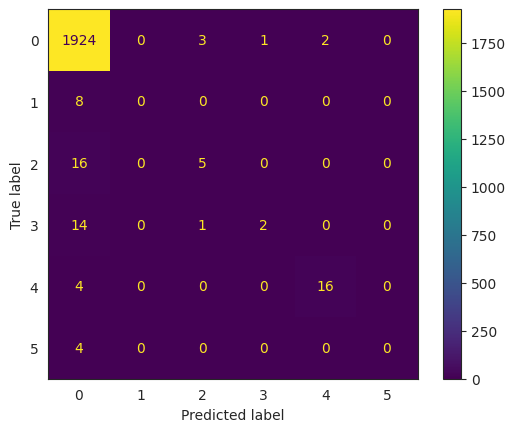

In [22]:
cm = confusion_matrix(y_true=y_test , y_pred=y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
cm_display.plot()

## Decision Trees

In [23]:
start = time.time()
model = DecisionTreeClassifier(criterion="entropy", random_state=42).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average="weighted")
MCC = matthews_corrcoef(y_test, y_pred)

print(  "Accuracy: " + "{:.2%}".format(accuracy),
        "\nRecall: " + "{:.2%}".format(recall),
        "\nPrecison: " + "{:.2%}".format(precision),
        "\nF1-Score: " + "{:.2%}".format(f1s),
        "\nMCC: " + "{:.2%}".format(MCC),
        "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
        "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
        "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
        )

Accuracy: 98.65% 
Recall: 98.65% 
Precison: 98.60% 
F1-Score: 98.63% 
MCC: 80.15% 
time to train: 0.11 s 
time to predict: 0.00 s 
total: 0.11 s


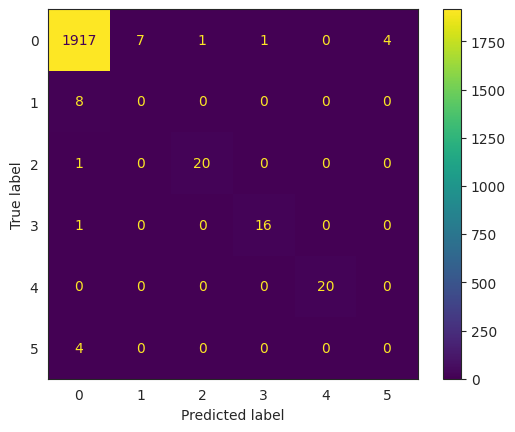

In [24]:
cm = confusion_matrix(y_true=y_test , y_pred=y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
cm_display.plot()

## Random Forrest

In [25]:
start = time.time()
model = RandomForestClassifier(n_estimators=100, criterion="entropy", n_jobs=-1, random_state=42, bootstrap=True).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average="weighted")
MCC = matthews_corrcoef(y_test, y_pred)

print(  "Accuracy: " + "{:.2%}".format(accuracy),
        "\nRecall: " + "{:.2%}".format(recall),
        "\nPrecison: " + "{:.2%}".format(precision),
        "\nF1-Score: " + "{:.2%}".format(f1s),
        "\nMCC: " + "{:.2%}".format(MCC),
        "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
        "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
        "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
        )

Accuracy: 99.30% 
Recall: 99.30% 
Precison: 98.71% 
F1-Score: 99.00% 
MCC: 89.25% 
time to train: 0.69 s 
time to predict: 0.06 s 
total: 0.75 s


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


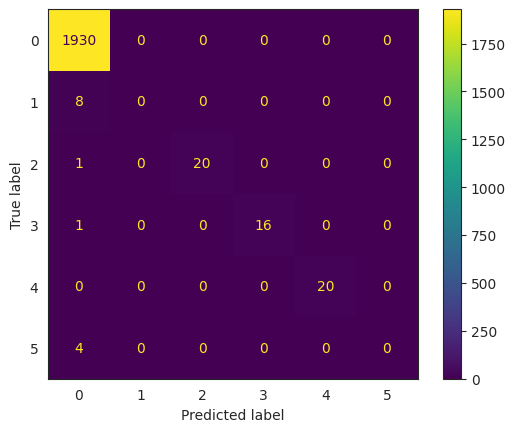

In [26]:
cm = confusion_matrix(y_true=y_test , y_pred=y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
cm_display.plot()

## Gradient Boosting

In [27]:
start = time.time()
model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42).fit(X_train, y_train)
end_train = time.time()
y_pred = model.predict(X_test)
end_predict = time.time()

accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
f1s = f1_score(y_test, y_pred, average="weighted")
MCC = matthews_corrcoef(y_test, y_pred)

print("Accuracy: " + "{:.2%}".format(accuracy),
      "\nRecall: " + "{:.2%}".format(recall),
      "\nPrecison: " + "{:.2%}".format(precision),
      "\nF1-Score: " + "{:.2%}".format(f1s),
      "\nMCC: " + "{:.2%}".format(MCC),
      "\ntime to train: " + "{:.2f}".format(end_train - start) + " s",
      "\ntime to predict: " + "{:.2f}".format(end_predict - end_train) + " s",
      "\ntotal: " + "{:.2f}".format(end_predict - start) + " s"
      )

Accuracy: 99.10% 
Recall: 99.10% 
Precison: 98.75% 
F1-Score: 98.93% 
MCC: 86.25% 
time to train: 10.08 s 
time to predict: 0.01 s 
total: 10.09 s


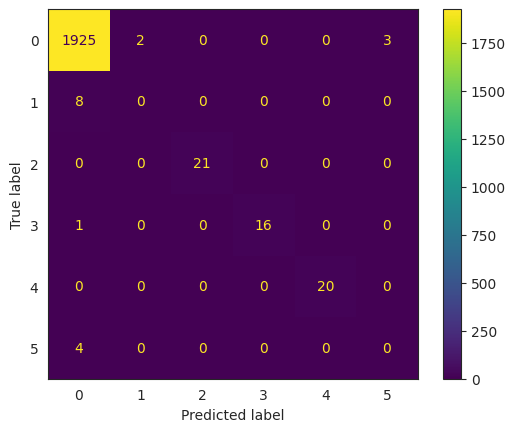

In [28]:
cm = confusion_matrix(y_true=y_test , y_pred=y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
cm_display.plot()

## Neural MLP

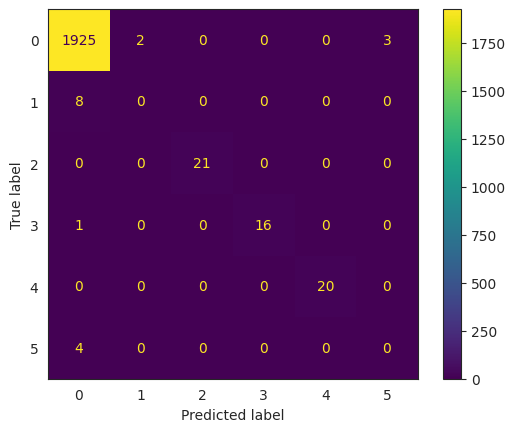

In [29]:
cm = confusion_matrix(y_true=y_test , y_pred=y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
cm_display.plot()